In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import slic, mark_boundaries, find_boundaries
from skimage.filters import gabor
from skimage.color import rgb2gray, label2rgb
from skimage.measure import regionprops
from scipy.spatial import KDTree
from scipy.spatial.distance import cdist
from tqdm.notebook import tqdm
from joblib import Parallel, delayed

In [2]:
target_image_path = 'refrence-targets/target2.png'
reference_image_path = 'refrence-targets/reference2.png'

(-0.5, 503.5, 377.5, -0.5)

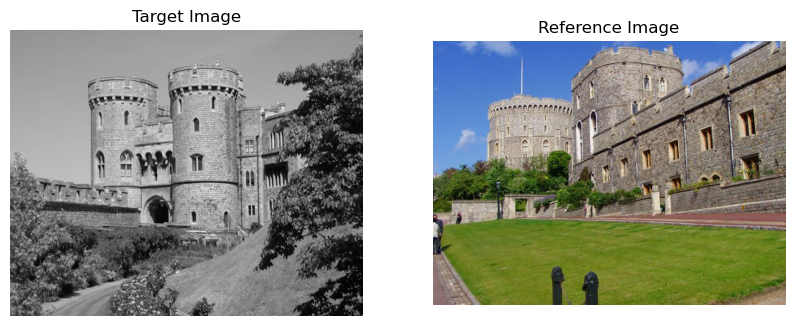

In [3]:
# Load grayscale target image and color reference image
target_image = cv2.imread(target_image_path, cv2.IMREAD_GRAYSCALE)
reference_image = cv2.imread(reference_image_path, cv2.IMREAD_COLOR)
reference_image = cv2.cvtColor(reference_image, cv2.COLOR_BGR2RGB)

# Show the two images
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.imshow(target_image, cmap='gray')
plt.title('Target Image')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(reference_image)
plt.title('Reference Image')
plt.axis('off')

In [4]:
# Convert to Lab color space
target_lab = cv2.cvtColor(cv2.cvtColor(target_image, cv2.COLOR_GRAY2BGR), cv2.COLOR_BGR2Lab)
reference_lab = cv2.cvtColor(reference_image, cv2.COLOR_BGR2Lab)

1-super pixels

In [5]:
# # Apply SLIC Superpixel Segmentation

# #the input number of superpixels are chosen to keep an average superpixel size of around 40 pixels.

# height, width = target_lab.shape[:2]
# num_segments = (height * width) // 40

# target_superpixels = slic(target_lab, n_segments=num_segments, compactness=10, sigma=1, start_label=0)
# reference_superpixels = slic(reference_lab, n_segments=num_segments, compactness=10, sigma=1, start_label=0)

# # Display Superpixel Boundaries
# fig, ax = plt.subplots(1, 2, figsize=(10, 5))
# ax[0].imshow(mark_boundaries(target_image, target_superpixels, color=(1, 0, 0)))
# ax[0].set_title("Target Image - Superpixels")
# ax[1].imshow(mark_boundaries(reference_image, reference_superpixels, color=(1, 0, 0)))
# ax[1].set_title("Reference Image - Superpixels")
# plt.show()

another superpixel trial

In [6]:
import numpy as np
from skimage.segmentation import mark_boundaries
from skimage.color import rgb2lab, gray2rgb
import matplotlib.pyplot as plt

def get_neighbors(segments, segment_id):
    """Find neighboring segments for a given superpixel."""
    mask = segments == segment_id
    neighbors = set()
    
    # Check 8-connectivity (all adjacent pixels)
    for y, x in np.argwhere(mask):
        for dy in [-1, 0, 1]:
            for dx in [-1, 0, 1]:
                if dy == 0 and dx == 0:
                    continue
                ny, nx = y + dy, x + dx
                if 0 <= ny < segments.shape[0] and 0 <= nx < segments.shape[1]:
                    neighbor = segments[ny, nx]
                    if neighbor != segment_id:
                        neighbors.add(neighbor)
    return neighbors

def merge_similar_regions(image, segments, color_threshold=15):
    """Merge superpixels based on color similarity to neighbors."""
    # Convert grayscale to RGB if needed
    if len(image.shape) == 2:  # Grayscale
        image = gray2rgb(image)
    else:
        image = image.copy()
    
    # Convert image to Lab space for perceptual color distance
    lab_image = rgb2lab(image)
    merged_segments = segments.copy()
    segment_ids = set(segments.flatten())

    for segment_id in segment_ids:
        neighbors = get_neighbors(segments, segment_id)
        segment_mask = segments == segment_id
        segment_color = lab_image[segment_mask].mean(axis=0)

        for neighbor in neighbors:
            neighbor_mask = segments == neighbor
            neighbor_color = lab_image[neighbor_mask].mean(axis=0)
            
            # Calculate Euclidean color distance in Lab space
            color_distance = np.linalg.norm(segment_color - neighbor_color)
            if color_distance < color_threshold:
                merged_segments[neighbor_mask] = segment_id  # Merge neighbor into segment

    return merged_segments

# Display function
def display_superpixels(image, segments, title="Superpixels"):
    plt.figure(figsize=(8, 8))
    plt.imshow(mark_boundaries(image, segments, color=(1, 0, 0)))
    plt.title(title)
    plt.axis('off')
    plt.show()


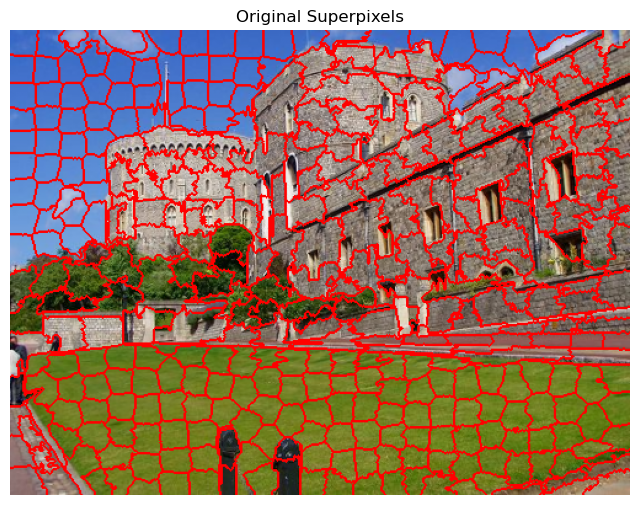

Number of Superpixels: 355


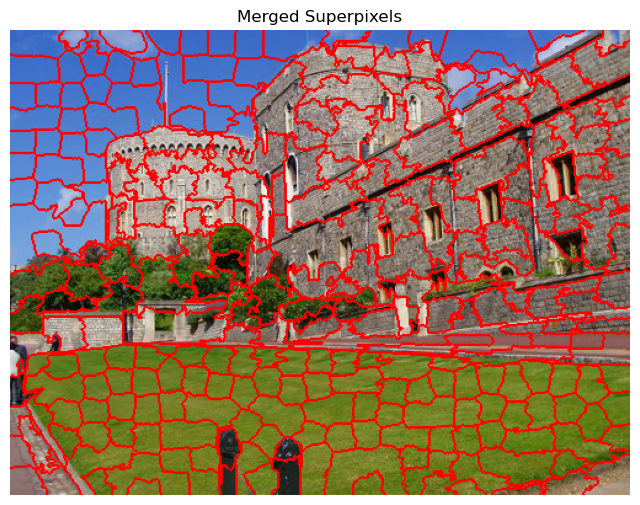

Number of Superpixels after merging: 242


In [7]:
ref_height, ref_width, _ = reference_lab.shape
ref_desired_superpixel_size = 20
ref_num_segments = (ref_height * ref_width) // (ref_desired_superpixel_size ** 2)

# Apply SLIC superpixels
segments = slic(reference_image, n_segments=ref_num_segments, compactness=10)

# Merge similar regions
merged_segments = merge_similar_regions(reference_image, segments)

# Display results
display_superpixels(reference_image, segments, title="Original Superpixels")
print(f"Number of Superpixels: {len(np.unique(segments))}")
display_superpixels(reference_image, merged_segments, title="Merged Superpixels")
print(f"Number of Superpixels after merging: {len(np.unique(merged_segments))}")

reference_superpixels = merged_segments.copy()


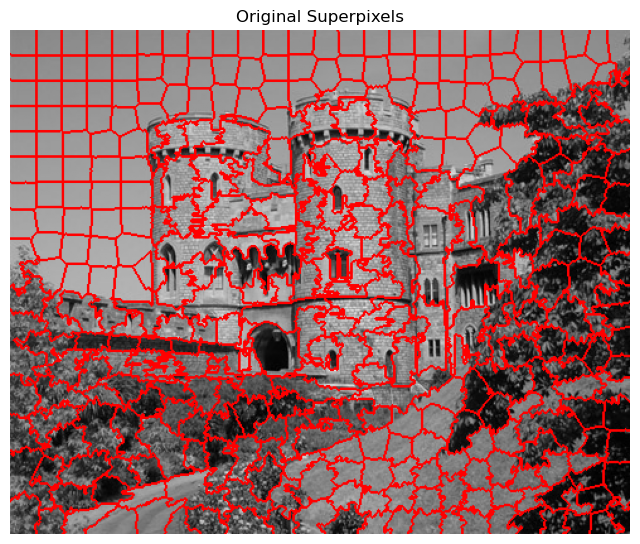

Number of Superpixels: 358


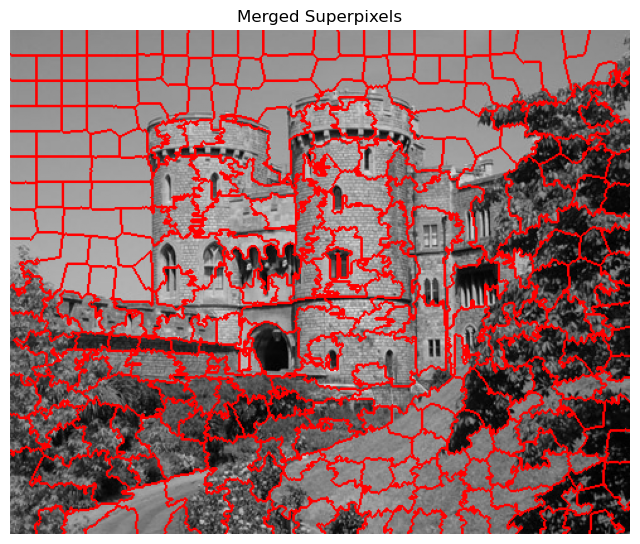

Number of Superpixels after merging: 245


In [8]:
tar_height, tar_width, _ = target_lab.shape
tar_desired_superpixel_size = ref_desired_superpixel_size
tar_num_segments = (tar_height * tar_width) // (tar_desired_superpixel_size ** 2)

# Apply SLIC superpixels
segments = slic(target_lab, n_segments=tar_num_segments, compactness=10)

# Merge similar regions
merged_segments = merge_similar_regions(target_image, segments)

# Display results
display_superpixels(target_image, segments, title="Original Superpixels")
print(f"Number of Superpixels: {len(np.unique(segments))}")
display_superpixels(target_image, merged_segments, title="Merged Superpixels")
print(f"Number of Superpixels after merging: {len(np.unique(merged_segments))}")

target_superpixels = merged_segments.copy()

In [9]:
# Print number of superpixels and neighbors for each image
print(f"Number of Superpixels (Target): {len(np.unique(target_superpixels))}")
print(f"Number of Superpixels (Reference): {len(np.unique(reference_superpixels))}")

Number of Superpixels (Target): 245
Number of Superpixels (Reference): 242


In [10]:
print(f"superpixels shape: {target_superpixels.shape}")
print(f"superpixels shape: {reference_superpixels.shape}")

superpixels shape: (400, 492)
superpixels shape: (378, 504)


In [11]:
print(f"superpixels first five: {target_superpixels[:5]}")

superpixels first five: [[28 28 28 ... 49 49 49]
 [28 28 28 ... 49 49 49]
 [28 28 28 ... 49 49 49]
 [28 28 28 ... 49 49 49]
 [28 28 28 ... 49 49 49]]


In [12]:
print(f"superpixels last five: {target_superpixels[-5:]}")

superpixels last five: [[345 345 345 ... 358 358 358]
 [345 345 345 ... 358 358 358]
 [345 345 345 ... 358 358 358]
 [345 345 345 ... 358 358 358]
 [345 345 345 ... 358 358 358]]


2-Feature extraction

In [13]:
import numpy as np
from skimage.segmentation import slic, mark_boundaries, find_boundaries
from skimage.color import rgb2lab
import matplotlib.pyplot as plt
import cv2
from skimage.filters import gabor

# Function to extract features for each pixel
def extract_pixel_features(image):
    height, width = image.shape[:2]
    features = np.zeros((height, width, 74))  # Adjusted size for Gabor and ORB features

    # Ensure the image has three channels (RGB)
    if len(image.shape) == 2 or image.shape[2] == 1:
        gray_image = image
    else:
        # Compute intensity
        gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    features[:, :, 0] = gray_image

    # Compute standard deviation in a 5x5 window
    std_dev = cv2.boxFilter(gray_image**2, -1, (5, 5)) - cv2.boxFilter(gray_image, -1, (5, 5))**2
    features[:, :, 1] = np.sqrt(std_dev)

    # # Compute Gabor features
    # orientations = np.linspace(0, np.pi, 8, endpoint=False)
    # scales = [1, 2, 3, 4, 5]
    # for i, (frequency, theta) in enumerate([(scale, orientation) for scale in scales for orientation in orientations]):
    #     real, imag = gabor(gray_image, frequency=frequency, theta=theta)
    #     features[:, :, 2 + i] = real
    # Compute Gabor features (magnitude)
    orientations = np.linspace(0, np.pi, 8, endpoint=False)
    scales = [np.exp(i) for i in range(5)]
    gabor_index = 2
    for scale in scales:
        for orientation in orientations:
            real, imag = gabor(gray_image, frequency=scale, theta=orientation)
            magnitude = np.sqrt(real**2 + imag**2)
            features[:, :, gabor_index] = magnitude
            gabor_index += 1

    # Compute ORB descriptors
    orb = cv2.ORB_create()
    keypoints, descriptors = orb.detectAndCompute(gray_image, None)
    if descriptors is not None:
        for kp, desc in zip(keypoints, descriptors):
            x, y = int(kp.pt[0]), int(kp.pt[1])
            if x < width and y < height:  # Ensure the keypoint is within image bounds
                features[y, x, 42:74] = desc  # Adjusted indices for ORB features

    return features,keypoints

# Function to extract features for each superpixel
def extract_superpixel_features(image, superpixels):
    pixel_features, _ = extract_pixel_features(image)
    features = {}
    unique_labels = np.unique(superpixels)

    for label in unique_labels:
        mask = (superpixels == label)
        superpixel_pixels = pixel_features[mask]

        # Compute mean feature vector for the superpixel
        mean_intensity = np.mean(superpixel_pixels[:, 0])
        mean_std_dev = np.mean(superpixel_pixels[:, 1])
        mean_gabor = np.mean(superpixel_pixels[:, 2:42], axis=0)  # Adjusted indices for Gabor features
        mean_orb = np.mean(superpixel_pixels[:, 42:74], axis=0)  # Adjusted indices for ORB features

        # Store features in a dictionary
        features[label] = {
            'mean_intensity': mean_intensity,
            'std_dev': mean_std_dev,
            'gabor': mean_gabor,
            'orb': mean_orb  # Updated key for ORB features
        }

    return features

# Extract features for target and reference images
target_features = extract_superpixel_features(target_image, target_superpixels)
reference_features = extract_superpixel_features(reference_image, reference_superpixels)

# Function to compute neighbors of each superpixel
def get_neighbors(superpixels):
    neighbors = {}
    for region in np.unique(superpixels):
        mask = (superpixels == region)
        dilated = cv2.dilate(mask.astype(np.uint8), np.ones((3, 3), np.uint8))
        neighbor_labels = np.unique(superpixels[(dilated == 1) & (~mask)])
        neighbors[region] = neighbor_labels[neighbor_labels != region]
    return neighbors

# Compute neighbors
neighbors_target = get_neighbors(target_superpixels)
neighbors_reference = get_neighbors(reference_superpixels)

# Function to compute average intensity and standard deviation features for neighboring superpixels
def compute_neighbor_features(superpixel_features, neighbors):
    neighbor_features = {}
    for label, neighbor_labels in neighbors.items():
        if len(neighbor_labels) > 0:
            neighbor_intensity = np.mean([superpixel_features[n]['mean_intensity'] for n in neighbor_labels])
            neighbor_std_dev = np.mean([superpixel_features[n]['std_dev'] for n in neighbor_labels])
        else:
            neighbor_intensity = superpixel_features[label]['mean_intensity']
            neighbor_std_dev = superpixel_features[label]['std_dev']
        
        neighbor_features[label] = {
            'neighbor_intensity': neighbor_intensity,
            'neighbor_std_dev': neighbor_std_dev
        }
    
    return neighbor_features

# Compute neighbor features
target_neighbor_features = compute_neighbor_features(target_features, neighbors_target)
reference_neighbor_features = compute_neighbor_features(reference_features, neighbors_reference)

# Combine mean features and neighbor features
def combine_features(superpixel_features, neighbor_features):
    combined_features = {}
    for label in superpixel_features.keys():
        combined_features[label] = np.concatenate((
            [superpixel_features[label]['mean_intensity']],
            [neighbor_features[label]['neighbor_intensity']],
            [superpixel_features[label]['std_dev']],
            [neighbor_features[label]['neighbor_std_dev']],
            superpixel_features[label]['gabor'],
            superpixel_features[label]['orb']
        ))
    return combined_features

target_combined_features = combine_features(target_features, target_neighbor_features)
reference_combined_features = combine_features(reference_features, reference_neighbor_features)

# Example: Print features for the first few superpixels
for label in list(target_combined_features.keys())[:5]:
    print(f"Superpixel {label} combined features: {target_combined_features[label]}")

Superpixel 26 combined features: [143.965      141.18809419  10.25542969   9.9328164    7.00225586
   7.18515625  10.41755859   7.35197266   7.00225586   7.34865234
  10.39164063   7.18662109   8.82041016   8.82041016   8.82041016
   8.82041016   8.82041016   8.82041016   8.82041016   8.82041016
   7.82234375   7.82234375   7.82234375   7.82234375   7.82234375
   7.82234375   7.82234375   7.82234375   9.26887695   9.26887695
   9.26887695   9.26887695   9.26887695   9.26887695   9.26887695
   9.26887695  12.84209961  12.84209961  12.84209961  12.84209961
  12.84209961  12.84209961  12.84209961  12.84209961   0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.        ]
Superpixel 28 comb

Check

In [14]:
# Check if there are any ORB features computed for any superpixel
count =0 
for label, features in target_features.items():
    if np.any(features['orb']):
        # print(f"Superpixel {label} has non-zero ORB features: {features['orb']}")
        print(f"Superpixel {label} has non-zero ORB features")
        count += 1

print(f"Number of superpixels with non-zero ORB features: {count} out of {len(target_features)}")


Superpixel 73 has non-zero ORB features
Superpixel 75 has non-zero ORB features
Superpixel 87 has non-zero ORB features
Superpixel 97 has non-zero ORB features
Superpixel 101 has non-zero ORB features
Superpixel 102 has non-zero ORB features
Superpixel 103 has non-zero ORB features
Superpixel 106 has non-zero ORB features
Superpixel 111 has non-zero ORB features
Superpixel 112 has non-zero ORB features
Superpixel 118 has non-zero ORB features
Superpixel 119 has non-zero ORB features
Superpixel 120 has non-zero ORB features
Superpixel 122 has non-zero ORB features
Superpixel 123 has non-zero ORB features
Superpixel 124 has non-zero ORB features
Superpixel 128 has non-zero ORB features
Superpixel 136 has non-zero ORB features
Superpixel 142 has non-zero ORB features
Superpixel 143 has non-zero ORB features
Superpixel 144 has non-zero ORB features
Superpixel 145 has non-zero ORB features
Superpixel 155 has non-zero ORB features
Superpixel 160 has non-zero ORB features
Superpixel 161 has n

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage.filters import gabor

def visualize_features(image):
    # Function to extract pixel features for visualization
    def extract_pixel_features(image):
        height, width = image.shape[:2]
        features = np.zeros((height, width, 74))  # Adjusted size for Gabor and ORB features

        # Ensure the image has three channels (RGB)
        if len(image.shape) == 2 or image.shape[2] == 1:
            gray_image = image
        else:
            # Compute intensity
            gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        
        features[:, :, 0] = gray_image

        # Compute standard deviation in a 5x5 window
        std_dev = cv2.boxFilter(gray_image**2, -1, (5, 5)) - cv2.boxFilter(gray_image, -1, (5, 5))**2
        features[:, :, 1] = np.sqrt(std_dev)

        # Compute Gabor features (magnitude)
        orientations = np.linspace(0, np.pi, 8, endpoint=False)
        scales = [np.exp(i) for i in range(5)]
        gabor_index = 2
        for scale in scales:
            for orientation in orientations:
                real, imag = gabor(gray_image, frequency=scale, theta=orientation)
                magnitude = np.sqrt(real**2 + imag**2)
                features[:, :, gabor_index] = magnitude
                gabor_index += 1

        # Compute ORB descriptors
        orb = cv2.ORB_create()
        keypoints, descriptors = orb.detectAndCompute(gray_image, None)
        if descriptors is not None:
            for kp, desc in zip(keypoints, descriptors):
                x, y = int(kp.pt[0]), int(kp.pt[1])
                if x < width and y < height:  # Ensure the keypoint is within image bounds
                    features[y, x, 42:74] = desc  # Adjusted indices for ORB features

        return features, keypoints

    # Extract pixel features for visualization
    pixel_features, keypoints = extract_pixel_features(image)

    # Visualize Intensity
    plt.figure(figsize=(10, 5))
    plt.imshow(pixel_features[:, :, 0], cmap='gray')
    plt.title("Intensity")
    plt.colorbar()
    plt.show()

    # Visualize Standard Deviation
    plt.figure(figsize=(10, 5))
    plt.imshow(pixel_features[:, :, 1], cmap='gray')
    plt.title("Standard Deviation")
    plt.colorbar()
    plt.show()

    # Visualize Gabor Features
    fig, axes = plt.subplots(5, 8, figsize=(20, 10))
    axes = axes.ravel()
    orientations = np.linspace(0, np.pi, 8, endpoint=False)
    scales = [1, 2, 3, 4, 5]
    gabor_index = 2
    for scale in scales:
        for orientation in orientations:
            axes[gabor_index - 2].imshow(pixel_features[:, :, gabor_index], cmap='gray')
            axes[gabor_index - 2].set_title(f"Scale {scale}, Orientation {orientation:.2f}")
            axes[gabor_index - 2].axis('off')
            gabor_index += 1
    plt.tight_layout()
    plt.show()

    # Visualize ORB Keypoints
    if len(image.shape) == 2 or image.shape[2] == 1:
        gray_image = image
    else:
        gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    keypoint_image = cv2.drawKeypoints(gray_image, keypoints, None, color=(0, 255, 0))
    plt.figure(figsize=(10, 5))
    plt.imshow(keypoint_image)
    plt.title("ORB Keypoints")
    plt.show()

    # Check if there are any ORB features computed for any superpixel
    non_zero_orb_superpixels = sum(np.any(pixel_features[:, :, 42:74], axis=(0, 1)))
    print(f"Number of superpixels with non-zero ORB features: {non_zero_orb_superpixels}")

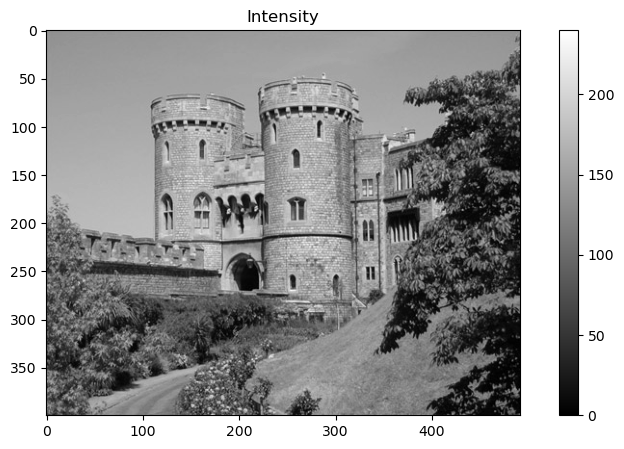

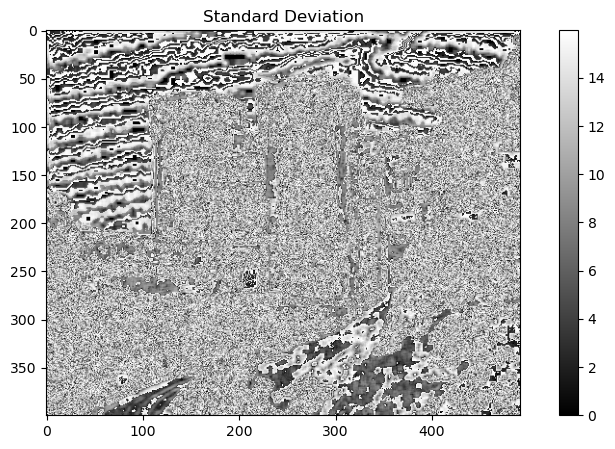

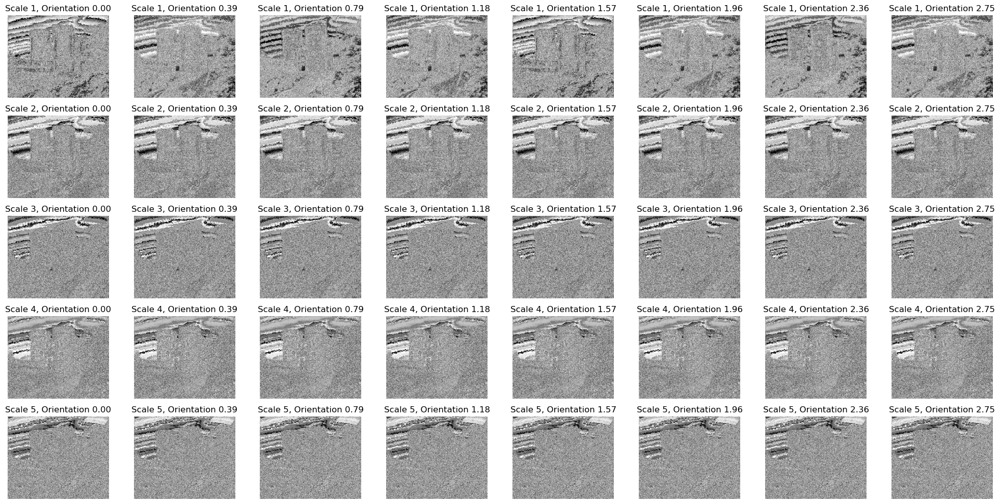

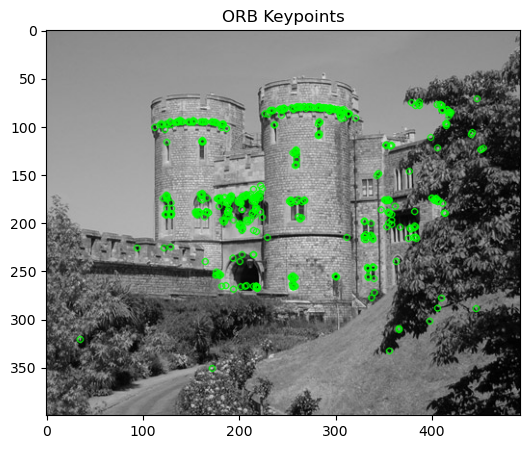

Number of superpixels with non-zero ORB features: 32


In [16]:
visualize_features(target_image)

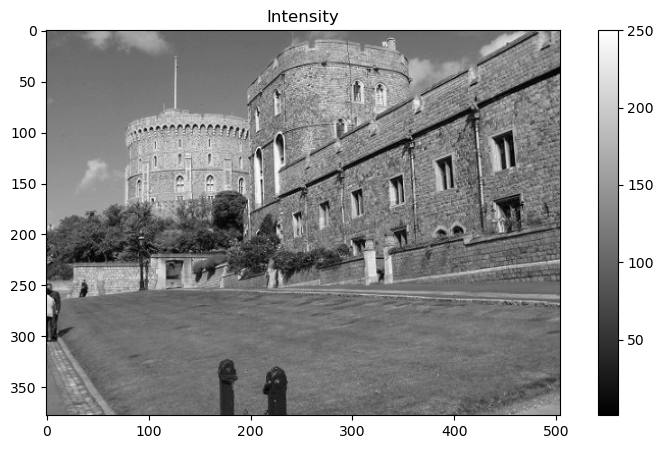

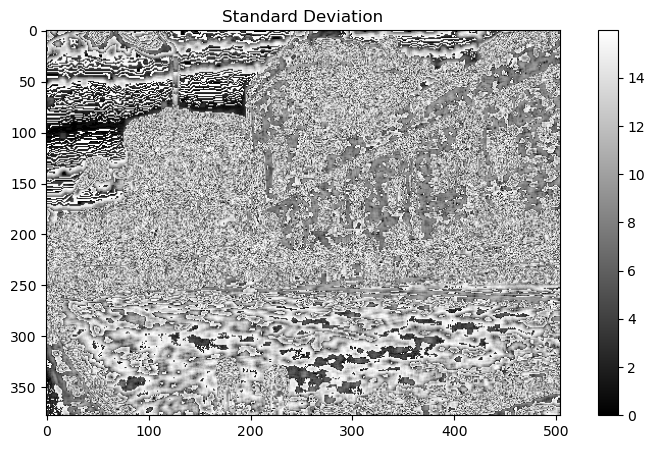

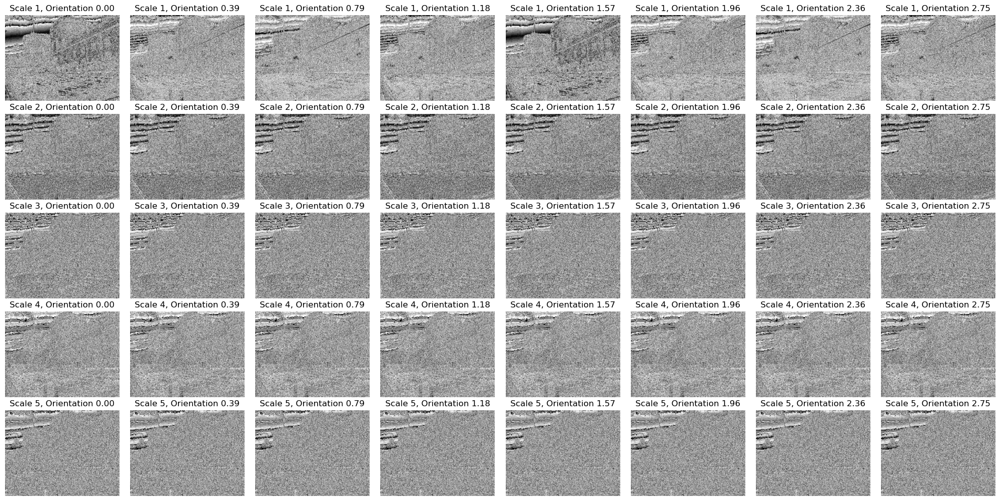

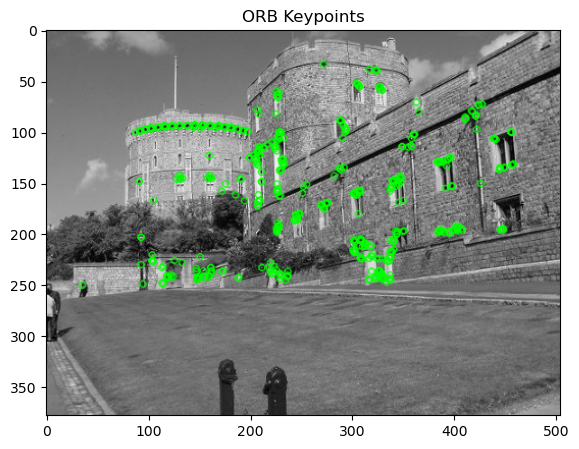

Number of superpixels with non-zero ORB features: 32


In [17]:
visualize_features(reference_image)

3-cascade feature matching

In [18]:
import numpy as np
from skimage.segmentation import slic, mark_boundaries
from skimage.color import rgb2lab
import matplotlib.pyplot as plt
import cv2
from skimage.filters import gabor

# Function to compute Euclidean distance between two feature vectors
def euclidean_distance(f1, f2):
    return np.linalg.norm(f1 - f2)

# # Function to perform cascade feature matching
# def cascade_feature_matching(target_combined_features, reference_combined_features):
#     matched_superpixels = {}
#     weights = {'gabor': 0.2, 'orb': 0.5, 'intensity': 0.2, 'std_dev': 0.1}

#     for t_label, t_features in target_combined_features.items():
#         # Step 1: Filter based on Gabor features
#         gabor_distances = {r_label: euclidean_distance(t_features[4:44], r_features[4:44])
#                            for r_label, r_features in reference_combined_features.items()}
#         gabor_sorted = sorted(gabor_distances.items(), key=lambda x: x[1])
        
#         # Filter out the top 50% of superpixels based on Gabor distance
#         gabor_filtered = [r_label for r_label, _ in gabor_sorted[:len(gabor_sorted)//2]]

#         # Step 2: Filter based on ORB features
#         orb_distances = {r_label: euclidean_distance(t_features[44:], reference_combined_features[r_label][44:])
#                          for r_label in gabor_filtered}
#         orb_sorted = sorted(orb_distances.items(), key=lambda x: x[1])
#         orb_filtered = [r_label for r_label, _ in orb_sorted[:len(orb_sorted)//2]]

#         # Step 3: Filter based on intensity features
#         intensity_distances = {r_label: euclidean_distance(t_features[0], reference_combined_features[r_label][0])
#                                for r_label in orb_filtered}
#         intensity_sorted = sorted(intensity_distances.items(), key=lambda x: x[1])
#         intensity_filtered = [r_label for r_label, _ in intensity_sorted[:len(intensity_sorted)//2]]

#         # Step 4: Filter based on standard deviation features
#         std_dev_distances = {r_label: euclidean_distance(t_features[2], reference_combined_features[r_label][2])
#                              for r_label in intensity_filtered}
#         std_dev_sorted = sorted(std_dev_distances.items(), key=lambda x: x[1])
#         std_dev_filtered = [r_label for r_label, _ in std_dev_sorted]

#         # Compute matching cost
#         matching_costs = {r_label: (weights['gabor'] * gabor_distances[r_label] +
#                                     weights['orb'] * orb_distances[r_label] +
#                                     weights['intensity'] * intensity_distances[r_label] +
#                                     weights['std_dev'] * std_dev_distances[r_label])
#                           for r_label in std_dev_filtered}

#         best_match = min(matching_costs, key=matching_costs.get)
#         matched_superpixels[t_label] = best_match

#     return matched_superpixels

#TODO : parallelize the function and maybe use the filtering method in the above function

# Function to perform cascade feature matching without filtering the top 50% of superpixels at each step
def cascade_feature_matching(target_combined_features, reference_combined_features):
    matched_superpixels = {}
    weights = {'gabor': 0.2, 'orb': 0.5, 'intensity': 0.2, 'std_dev': 0.1}

    for t_label, t_features in tqdm(target_combined_features.items(),desc="Matching Progress"):
        # Compute distances for all features
        gabor_distances = {r_label: euclidean_distance(t_features[4:44], r_features[4:44])
                           for r_label, r_features in reference_combined_features.items()}
        orb_distances = {r_label: euclidean_distance(t_features[44:], r_features[44:])
                         for r_label, r_features in reference_combined_features.items()}
        intensity_distances = {r_label: euclidean_distance(t_features[0], r_features[0])
                               for r_label, r_features in reference_combined_features.items()}
        std_dev_distances = {r_label: euclidean_distance(t_features[2], r_features[2])
                             for r_label, r_features in reference_combined_features.items()}

        # Compute matching cost
        matching_costs = {r_label: (weights['gabor'] * gabor_distances[r_label] +
                                    weights['orb'] * orb_distances[r_label] +
                                    weights['intensity'] * intensity_distances[r_label] +
                                    weights['std_dev'] * std_dev_distances[r_label])
                          for r_label in reference_combined_features.keys()}

        best_match = min(matching_costs, key=matching_costs.get)
        matched_superpixels[t_label] = best_match

    return matched_superpixels

In [19]:
# Perform cascade feature matching
matched_superpixels = cascade_feature_matching(target_combined_features, reference_combined_features)

Matching Progress:   0%|          | 0/245 [00:00<?, ?it/s]

Check

In [20]:
# Print matched superpixels
print("Matched Superpixels:")
for t_label, r_label in matched_superpixels.items():
    print(f"Target Superpixel {t_label} matched with Reference Superpixel {r_label}")

print(f"Number of matched superpixels: {len(matched_superpixels)} out of {len(target_combined_features)}")

Matched Superpixels:
Target Superpixel 26 matched with Reference Superpixel 91
Target Superpixel 28 matched with Reference Superpixel 146
Target Superpixel 29 matched with Reference Superpixel 91
Target Superpixel 31 matched with Reference Superpixel 161
Target Superpixel 32 matched with Reference Superpixel 161
Target Superpixel 33 matched with Reference Superpixel 38
Target Superpixel 35 matched with Reference Superpixel 38
Target Superpixel 36 matched with Reference Superpixel 91
Target Superpixel 37 matched with Reference Superpixel 91
Target Superpixel 38 matched with Reference Superpixel 43
Target Superpixel 39 matched with Reference Superpixel 161
Target Superpixel 40 matched with Reference Superpixel 161
Target Superpixel 42 matched with Reference Superpixel 161
Target Superpixel 43 matched with Reference Superpixel 161
Target Superpixel 44 matched with Reference Superpixel 43
Target Superpixel 45 matched with Reference Superpixel 161
Target Superpixel 46 matched with Reference

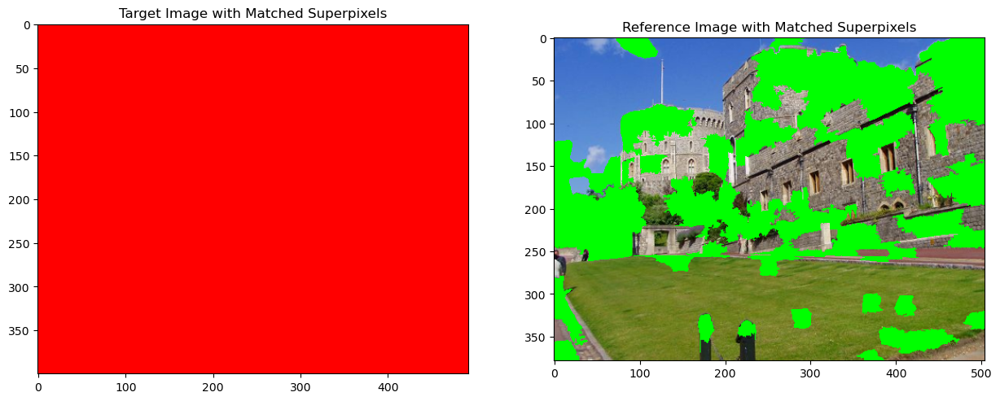

In [21]:
import numpy as np
import matplotlib.pyplot as plt

# Function to create a mask for the matched superpixels
def create_superpixel_mask(superpixels, matched_labels):
    mask = np.zeros(superpixels.shape, dtype=bool)
    for label in matched_labels:
        mask[superpixels == label] = True
    return mask

# Function to overlay dots on the matched superpixels
def overlay_dots(image, mask, color):
    overlay_image = image.copy()
    for c in range(3):  # Apply the color to each channel
        overlay_image[mask, c] = color[c]
    return overlay_image

# Create masks for the matched superpixels
target_matched_labels = list(matched_superpixels.keys())
reference_matched_labels = list(matched_superpixels.values())

target_mask = create_superpixel_mask(target_superpixels, target_matched_labels)
reference_mask = create_superpixel_mask(reference_superpixels, reference_matched_labels)

# Overlay dots on the original images
def overlay_dots(image, mask, color):
    overlay_image = image.copy()
    if len(overlay_image.shape) == 2:  # Grayscale image
        overlay_image = cv2.cvtColor(overlay_image, cv2.COLOR_GRAY2RGB)
    for c in range(3):  # Apply the color to each channel
        overlay_image[mask, c] = color[c]
    return overlay_image

target_image_with_dots = overlay_dots(target_image, target_mask, [255, 0, 0])  # Red dots
reference_image_with_dots = overlay_dots(reference_image, reference_mask, [0, 255, 0])  # Green dots

# Display the images with matched superpixels
fig, ax = plt.subplots(1, 2, figsize=(15, 10))
ax[0].imshow(target_image_with_dots)
ax[0].set_title("Target Image with Matched Superpixels")
ax[1].imshow(reference_image_with_dots)
ax[1].set_title("Reference Image with Matched Superpixels")
plt.show()

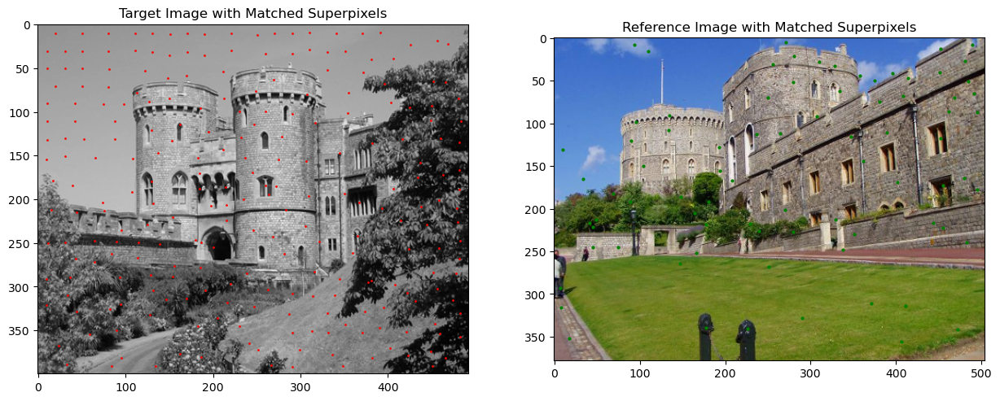

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import regionprops

# Function to create a mask for the matched superpixels
def create_superpixel_mask(superpixels, matched_labels):
    mask = np.zeros(superpixels.shape, dtype=bool)
    for label in matched_labels:
        mask[superpixels == label] = True
    return mask

# Function to get the centroids of the matched superpixels
def get_superpixel_centroids(superpixels, matched_labels):
    centroids = []
    for region in regionprops(superpixels):
        if region.label in matched_labels:
            centroids.append(region.centroid)
    return centroids

# Create masks for the matched superpixels
target_matched_labels = list(matched_superpixels.keys())
reference_matched_labels = list(matched_superpixels.values())

target_mask = create_superpixel_mask(target_superpixels, target_matched_labels)
reference_mask = create_superpixel_mask(reference_superpixels, reference_matched_labels)

# Get centroids of the matched superpixels
target_centroids = get_superpixel_centroids(target_superpixels, target_matched_labels)
reference_centroids = get_superpixel_centroids(reference_superpixels, reference_matched_labels)

# Display the images with matched superpixels
fig, ax = plt.subplots(1, 2, figsize=(15, 10))
ax[0].imshow(target_image, cmap='gray')
ax[0].set_title("Target Image with Matched Superpixels")
ax[1].imshow(reference_image)
ax[1].set_title("Reference Image with Matched Superpixels")

# Plot small markers at the centroids of the matched superpixels
for centroid in target_centroids:
    ax[0].plot(centroid[1], centroid[0], 'ro', markersize=1)  # Red dots
for centroid in reference_centroids:
    ax[1].plot(centroid[1], centroid[0], 'go', markersize=2)  # Green dots

plt.show()

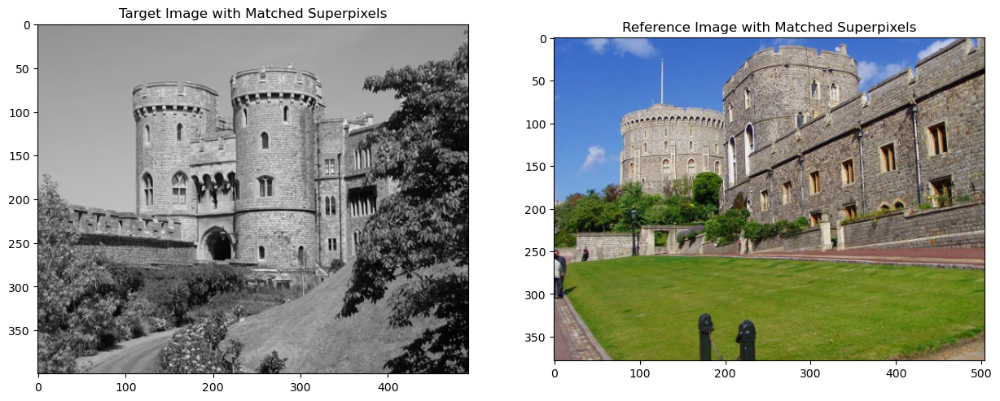

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import regionprops

# Function to create a mask for the matched superpixels
def create_superpixel_mask(superpixels, matched_labels):
    mask = np.zeros(superpixels.shape, dtype=bool)
    for label in matched_labels:
        mask[superpixels == label] = True
    return mask

# Function to get the centroids of the matched superpixels
def get_superpixel_centroids(superpixels, matched_labels):


    
    centroids = []
    for region in regionprops(superpixels):
        if region.label in matched_labels:
            centroids.append(region.centroid)
    return centroids

# Function to create a list of numbers from start to end with step 1
def create_number_list(start, end):
    return list(range(start, end + 1))

# Specify superpixels of interest
# superpixels_of_interest = [4000 - 5001]  
superpixels_of_interest = create_number_list(4500, 5000)

# Filter matched superpixels to include only those of interest
filtered_matched_superpixels = {t_label: r_label for t_label, r_label in matched_superpixels.items() if t_label in superpixels_of_interest}

# Create masks for the matched superpixels
target_matched_labels = list(filtered_matched_superpixels.keys())
reference_matched_labels = list(filtered_matched_superpixels.values())

target_mask = create_superpixel_mask(target_superpixels, target_matched_labels)
reference_mask = create_superpixel_mask(reference_superpixels, reference_matched_labels)

# Get centroids of the matched superpixels
target_centroids = get_superpixel_centroids(target_superpixels, target_matched_labels)
reference_centroids = get_superpixel_centroids(reference_superpixels, reference_matched_labels)

# Display the images with matched superpixels
fig, ax = plt.subplots(1, 2, figsize=(15, 10))
ax[0].imshow(target_image, cmap='gray')
ax[0].set_title("Target Image with Matched Superpixels")
ax[1].imshow(reference_image)
ax[1].set_title("Reference Image with Matched Superpixels")

# Plot small markers at the centroids of the matched superpixels
#colors: r:red, g:green, b:blue, c:cyan, m:magenta, y:yellow, k:black, w:white
for centroid in target_centroids:
    ax[0].plot(centroid[1], centroid[0], 'ro', markersize=5)  # Red dots
for centroid in reference_centroids:
    ax[1].plot(centroid[1], centroid[0], 'co', markersize=5)  # Green dots

plt.show()

Initial colorization

In [24]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tqdm import tqdm

# Function to colorize the target image after feature matching
def colorize_after_matching(target_lab, target_superpixels, matches, reference_lab):
    colorized_image = target_lab.copy()
    for target_idx, ref_idx in matches.items():
        ref_mask = (reference_superpixels == ref_idx)
        ref_pixels = reference_lab[ref_mask, 1:3]  # Get 'a' and 'b' channels
        avg_color = np.mean(ref_pixels, axis=0) if len(ref_pixels) > 0 else [0, 0]

        mask = (target_superpixels == target_idx)
        colorized_image[mask, 1] = avg_color[0]  # 'a' channel
        colorized_image[mask, 2] = avg_color[1]  # 'b' channel

    return colorized_image

# Apply initial colorization after feature matching
initial_colorized_lab = colorize_after_matching(target_lab, target_superpixels, matched_superpixels, reference_lab)

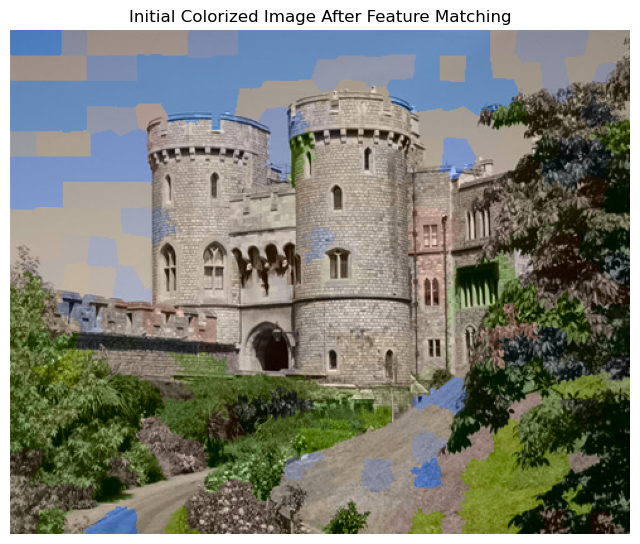

In [27]:
# Visualize the initial colorized image
initial_colorized_rgb = cv2.cvtColor(initial_colorized_lab, cv2.COLOR_Lab2RGB)
initial_colorized_rgb = cv2.cvtColor(initial_colorized_rgb, cv2.COLOR_RGB2BGR)
plt.figure(figsize=(8, 8))
plt.imshow(initial_colorized_rgb)
plt.title("Initial Colorized Image After Feature Matching")
plt.axis('off')
plt.show()

Trying segmentation

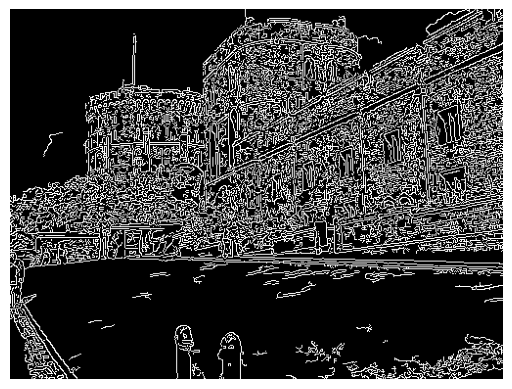

In [ ]:
import cv2
import numpy as np

def detect_boundaries(image, low_threshold=50, high_threshold=150):
    """
    Detects boundaries in an image using the Canny edge detection method.

    Parameters:
    - image: Input image (grayscale or RGB).
    - low_threshold: Lower threshold for edge detection.
    - high_threshold: Upper threshold for edge detection.

    Returns:
    - edges: Binary image with detected edges.
    """
    if len(image.shape) == 3:  # If image is RGB
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:  # Already grayscale
        gray = image

    edges = cv2.Canny(gray, low_threshold, high_threshold)
    return edges

image = reference_image
edges = detect_boundaries(image)
#show the image with edges
plt.imshow(edges, cmap='gray')
plt.axis('off')
plt.show()

In [82]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage import segmentation, color
from sklearn.cluster import KMeans

def slic_kmeans_segmentation(image, slic_segments, n_clusters=10):
    """
    Uses SLIC superpixels and K-Means clustering to merge similar regions.

    Parameters:
    - image: Input RGB image.
    - slic_segments: Precomputed SLIC superpixel labels.
    - n_clusters: Number of final segmented regions.

    Returns:
    - segmented_image: Image with merged regions.
    - clustered_labels: Labels for each region after K-Means clustering.
    """
    # Convert image to LAB color space for better color measurement
    image_lab = color.rgb2lab(image)

    # Compute mean color for each superpixel
    unique_segments = np.unique(slic_segments)
    features = []
    
    for segment in unique_segments:
        mask = slic_segments == segment
        mean_color = np.mean(image_lab[mask], axis=0)
        features.append(mean_color)

    # Apply K-Means clustering to merge similar superpixels
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    clustered_labels = kmeans.fit_predict(features)

    # Map the clustered labels back to the image
    clustered_image = np.zeros_like(image_lab)

    for i, segment in enumerate(unique_segments):
        mask = slic_segments == segment
        clustered_image[mask] = kmeans.cluster_centers_[clustered_labels[i]]

    # Convert LAB back to RGB
    segmented_image = (color.lab2rgb(clustered_image) * 255).astype(np.uint8)

    return segmented_image, clustered_labels


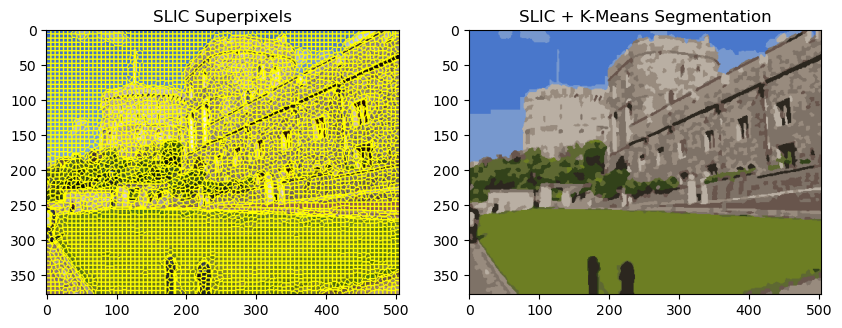

In [ ]:
# Load image
# image = cv2.imread('your_image.jpg')
# image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = reference_image

# Compute SLIC superpixels (if not already computed)
# slic_segments = segmentation.slic(image, n_segments=1500, compactness=10, start_label=1)
slic_segments = reference_superpixels

# Perform segmentation with K-Means clustering
segmented_image, clustered_labels = slic_kmeans_segmentation(image, slic_segments)

# Display results
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(segmentation.mark_boundaries(image, slic_segments))
plt.title("SLIC Superpixels")

plt.subplot(1, 2, 2)
plt.imshow(segmented_image)
plt.title("SLIC + K-Means Segmentation")
plt.show()

Trying voting

Step 1: Mean shift the target image

In [177]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, filters, segmentation, measure, morphology
from skimage.feature import peak_local_max
from scipy import ndimage as ndi
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.cluster import KMeans

# Load the image
image = target_image

# Check if the image is already in grayscale
if len(image.shape) == 2 or image.shape[2] == 1:
    gray_image = image
    is_gray = True
    # Convert grayscale image to RGB by stacking the grayscale values
    image = np.stack((gray_image,)*3, axis=-1)
else:
    # Convert to grayscale
    gray_image = color.rgb2gray(image)
    is_gray = False

watershed algo

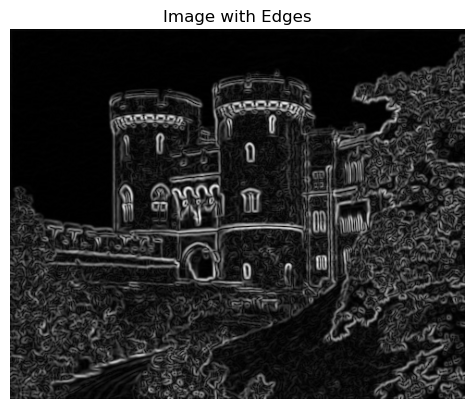

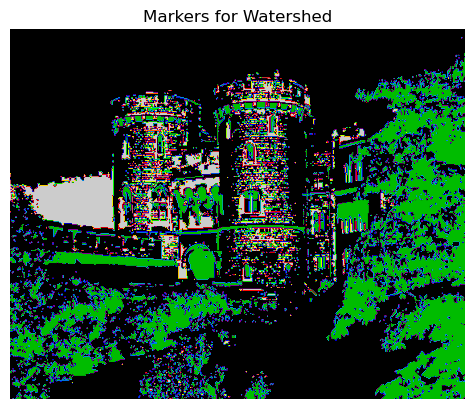

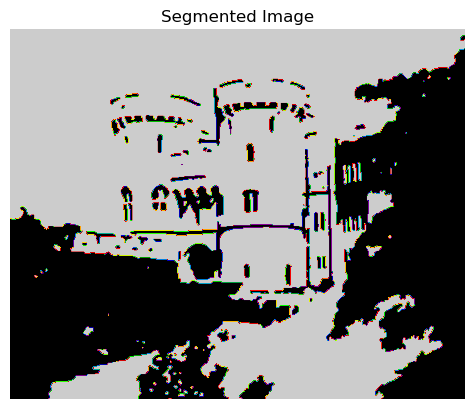

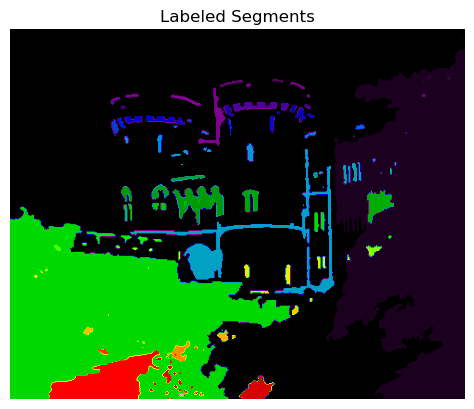

In [178]:
# Apply a Gaussian filter to smooth the image
smoothed_image = filters.gaussian(gray_image, sigma=1)

# Compute the gradient of the image
gradient = filters.sobel(smoothed_image)

# show the image with edges
plt.imshow(gradient, cmap='gray')
plt.title('Image with Edges')
plt.axis('off')
plt.show()

# Compute markers for the watershed algorithm
markers = np.zeros_like(gray_image, dtype=np.int32)
markers[gray_image < 68] = 1
markers[gray_image > 170] = 2

# show the markers
plt.imshow(markers, cmap='nipy_spectral')
plt.title("Markers for Watershed")
plt.axis('off')
plt.show()

# Apply the watershed algorithm
segmentation_result = segmentation.watershed(gradient, markers)

# show the segmented image
plt.imshow(segmentation_result, cmap='nipy_spectral')
plt.title("Segmented Image")
plt.axis('off')
plt.show()

# Label the segmented regions
labeled_segments = measure.label(segmentation_result)

# show the labeled segments
plt.imshow(labeled_segments, cmap='nipy_spectral')
plt.title("Labeled Segments")
plt.axis('off')
plt.show()

mean shift

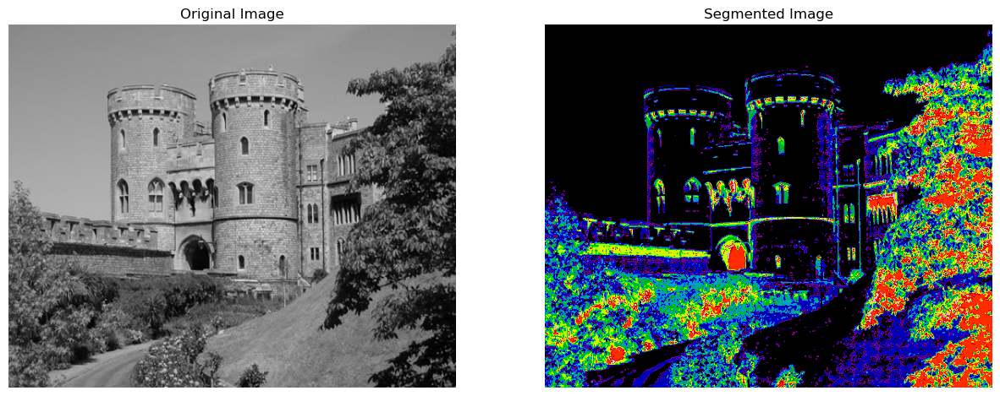

In [192]:
# Convert the image to LAB color space
lab_image = color.rgb2lab(image)

# Extract the a and b channels
ab = lab_image[:, :, 1:3]
ab = ab.reshape((-1, 2))

# Automatic bandwidth estimation for Mean Shift
# Estimate the bandwidth for mean shift
bandwidth = estimate_bandwidth(ab, quantile=0.1, n_samples=500)
# bandwidth = estimate_bandwidth(ab, quantile=0.1, n_samples=ab.shape[0])

# Perform mean shift clustering with specified parameters
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
ms.fit(ab)
labels = ms.labels_
cluster_centers = ms.cluster_centers_

# Reshape the labels to the original image shape
segmented_image = labels.reshape(lab_image.shape[:2])

# Visualize the segmentation
fig, ax = plt.subplots(1, 2, figsize=(15, 10))
ax[0].imshow(image, cmap='gray' if is_gray else None)
ax[0].set_title("Original Image")
ax[0].axis('off')

ax[1].imshow(segmented_image, cmap='nipy_spectral')
ax[1].set_title("Segmented Image")
ax[1].axis('off')

plt.show()

meanshift with l not ab

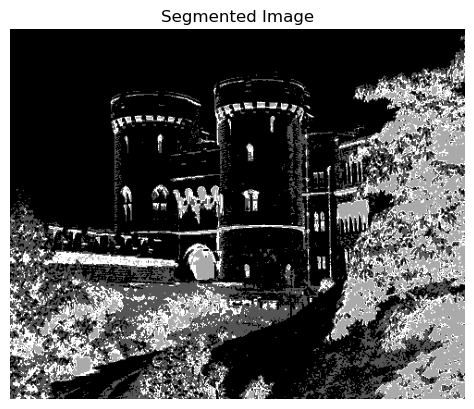

In [202]:
# Reshape the image to a 2D array of pixels
flat_image = image.reshape(-1, 1)

# Estimate the bandwidth for Mean Shift
bandwidth = estimate_bandwidth(flat_image, quantile=0.15, n_samples=500)

# Apply Mean Shift clustering
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
ms.fit(flat_image)

# Get the labels and cluster centers
labels = ms.labels_
cluster_centers = ms.cluster_centers_

# Reshape the labels to the original image shape
segmented_image = labels.reshape(image.shape)

# Normalize the segmented image to the range [0, 1]
segmented_image = segmented_image.astype(float) / np.max(segmented_image)

# Display the segmented image using matplotlib
plt.imshow(segmented_image, cmap='gray')
plt.title('Segmented Image')
plt.axis('off')
plt.show()

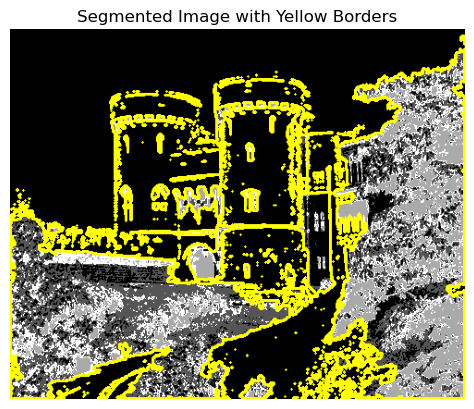

In [204]:
# Convert the segmented image to uint8
segmented_image_uint8 = (segmented_image * 255).astype(np.uint8)

# Ensure the image is single-channel
if len(segmented_image_uint8.shape) == 3:
    segmented_image_uint8 = cv2.cvtColor(segmented_image_uint8, cv2.COLOR_BGR2GRAY)

# Find contours in the segmented image
contours, _ = cv2.findContours(segmented_image_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Convert the segmented image to BGR for color display
segmented_image_bgr = cv2.cvtColor(segmented_image_uint8, cv2.COLOR_GRAY2BGR)

# Draw yellow borders around each segment
cv2.drawContours(segmented_image_bgr, contours, -1, (0, 255, 255), 2)

# Display the segmented image with borders using matplotlib
plt.imshow(cv2.cvtColor(segmented_image_bgr, cv2.COLOR_BGR2RGB))
plt.title('Segmented Image with Yellow Borders')
plt.axis('off')
plt.show()

Unique superpixels: 1, kept: False
Unique superpixels: 1, kept: False
Unique superpixels: 1, kept: False
Unique superpixels: 1, kept: False
Unique superpixels: 1, kept: False
Unique superpixels: 1, kept: False
Unique superpixels: 1, kept: False
Unique superpixels: 1, kept: False
Unique superpixels: 1, kept: False
Unique superpixels: 1, kept: False
Unique superpixels: 2, kept: False
Unique superpixels: 1, kept: False
Unique superpixels: 1, kept: False
Unique superpixels: 1, kept: False
Unique superpixels: 1, kept: False
Unique superpixels: 1, kept: False
Unique superpixels: 3, kept: True
Unique superpixels: 1, kept: False
Unique superpixels: 1, kept: False
Unique superpixels: 1, kept: False
Unique superpixels: 1, kept: False
Unique superpixels: 2, kept: False
Unique superpixels: 2, kept: False
Unique superpixels: 3, kept: True
Unique superpixels: 1, kept: False
Unique superpixels: 1, kept: False
Unique superpixels: 1, kept: False
Unique superpixels: 1, kept: False
Unique superpixels: 1,

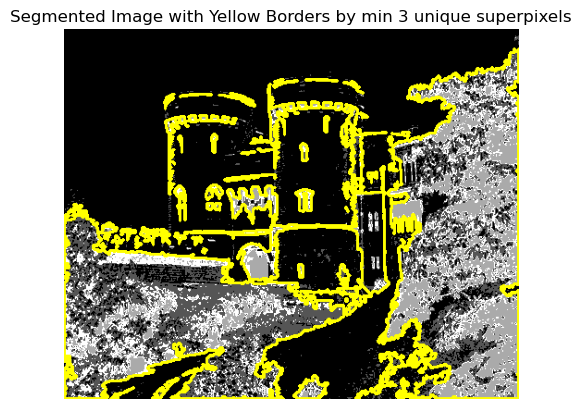

In [212]:
# Convert the segmented image to uint8
segmented_image_uint8 = (segmented_image * 255).astype(np.uint8)

# Ensure the image is single-channel
if len(segmented_image_uint8.shape) == 3:
    segmented_image_uint8 = cv2.cvtColor(segmented_image_uint8, cv2.COLOR_BGR2GRAY)

# Find contours in the segmented image
contours, _ = cv2.findContours(segmented_image_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Filter contours to keep only those with at least three unique superpixels
filtered_contours = []
for cnt in contours:
    mask = np.zeros(segmented_image_uint8.shape, dtype=np.uint8)
    cv2.drawContours(mask, [cnt], -1, 255, -1)
    superpixel_labels = target_superpixels[mask == 255]
    unique_superpixels = np.unique(superpixel_labels)
    if len(unique_superpixels) >= 3:
        filtered_contours.append(cnt)
    print(f"Unique superpixels: {len(unique_superpixels)}, kept: {len(unique_superpixels) >= 3}")

# Convert the segmented image to BGR for color display
segmented_image_bgr = cv2.cvtColor(segmented_image_uint8, cv2.COLOR_GRAY2BGR)

# Draw yellow borders around each selected segment
cv2.drawContours(segmented_image_bgr, filtered_contours, -1, (0, 255, 255), 2)

# Display the segmented image with borders using matplotlib
plt.imshow(cv2.cvtColor(segmented_image_bgr, cv2.COLOR_BGR2RGB))
plt.title('Segmented Image with Yellow Borders by min 3 unique superpixels')
plt.axis('off')
plt.show()

Step 2: Clustering Superpixels within Each Segment

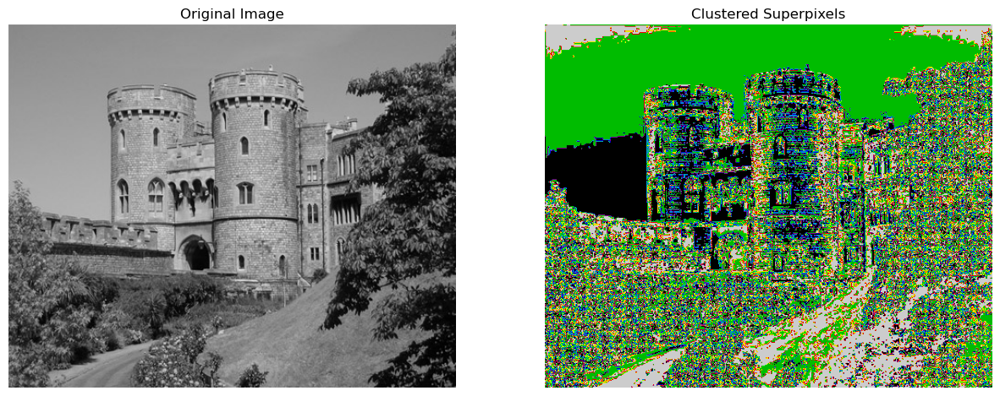

In [134]:
# Function to cluster superpixels within each segment
def cluster_superpixels_within_segment(segment_labels, lab_image, n_clusters=3):
    clustered_labels = np.zeros_like(segment_labels)
    unique_segments = np.unique(segment_labels)
    
    for segment in unique_segments:
        mask = (segment_labels == segment)
        if np.sum(mask) < 3:
            continue
        
        ab_values = lab_image[mask, 1:3]
        kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(ab_values)
        clustered_labels[mask] = kmeans.labels_ + 1  # Ensure labels start from 1
    
    return clustered_labels

# Cluster superpixels within each segment
clustered_superpixels = cluster_superpixels_within_segment(segmented_image, lab_image)

# Visualize the clustered superpixels
fig, ax = plt.subplots(1, 2, figsize=(15, 10))
ax[0].imshow(image, cmap='gray' if is_gray else None)
ax[0].set_title("Original Image")
ax[0].axis('off')

ax[1].imshow(clustered_superpixels, cmap='nipy_spectral')
ax[1].set_title("Clustered Superpixels")
ax[1].axis('off')

plt.show()

Step 3: Detecting Errors

In [114]:
# Function to detect sparse clusters
def detect_sparse_clusters(clustered_labels, threshold=0.5):
    unique_clusters, counts = np.unique(clustered_labels, return_counts=True)
    avg_cluster_size = np.mean(counts)
    sparse_clusters = unique_clusters[counts < (threshold * avg_cluster_size)]
    return sparse_clusters

# Detect sparse clusters
sparse_clusters = detect_sparse_clusters(clustered_superpixels)

Step 4: Reassigning Colors

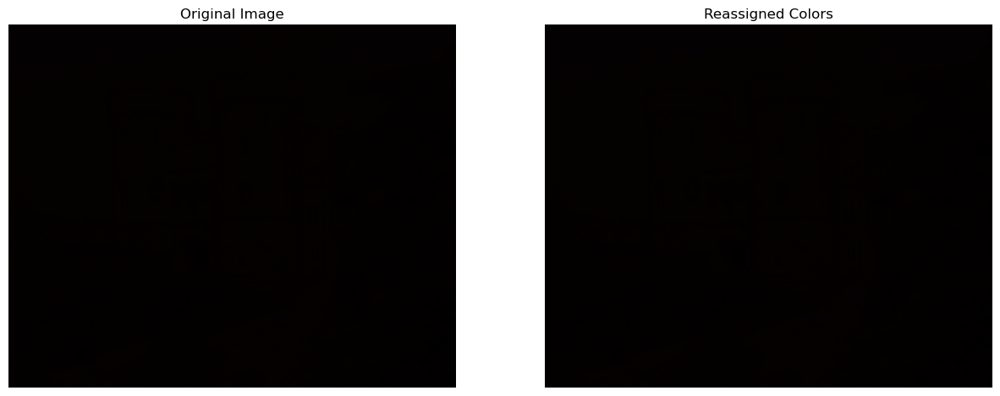

In [116]:
# Function to reassign colors to sparse clusters
def reassign_colors_to_sparse_clusters(clustered_labels, lab_image, sparse_clusters):
    reassigned_image = lab_image.copy()
    unique_segments = np.unique(clustered_labels)
    
    for segment in unique_segments:
        mask = (clustered_labels == segment)
        if np.sum(mask) < 3:
            continue
        
        segment_labels = clustered_labels[mask]
        segment_lab_values = lab_image[mask]
        
        for sparse_cluster in sparse_clusters:
            sparse_mask = (segment_labels == sparse_cluster)
            if np.sum(sparse_mask) == 0:
                continue
            
            dense_mask = ~sparse_mask
            dense_lab_values = segment_lab_values[dense_mask]
            avg_dense_color = np.mean(dense_lab_values, axis=0)
            
            reassigned_image[mask][sparse_mask] = avg_dense_color
    
    return reassigned_image

lab_image = initial_colorized_lab
image = initial_colorized_rgb

# Reassign colors to sparse clusters
reassigned_lab_image = reassign_colors_to_sparse_clusters(clustered_superpixels, lab_image, sparse_clusters)

# Convert the reassigned LAB image back to RGB
reassigned_rgb_image = color.lab2rgb(reassigned_lab_image)

# Visualize the reassigned colors
fig, ax = plt.subplots(1, 2, figsize=(15, 10))
ax[0].imshow(image, cmap='gray' if is_gray else None)
ax[0].set_title("Original Image")
ax[0].axis('off')

ax[1].imshow(reassigned_rgb_image)
ax[1].set_title("Reassigned Colors")
ax[1].axis('off')

plt.show()

Another trial

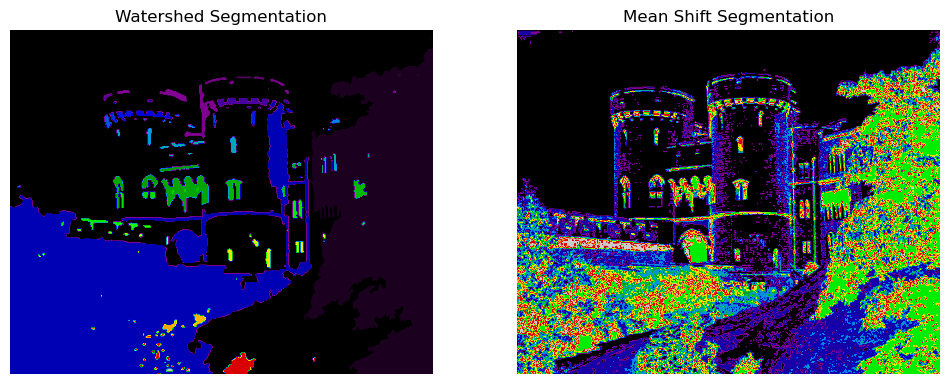

c:\Users\Omar_Desouki\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\Omar_Desouki\anaconda3\Lib\site-packages\sklearn\base.py:1473: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (2). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
c:\Users\Omar_Desouki\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\Omar_Desouki\anaconda3\Lib\site-packages\sklearn\base.py:1473: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (2). Possi

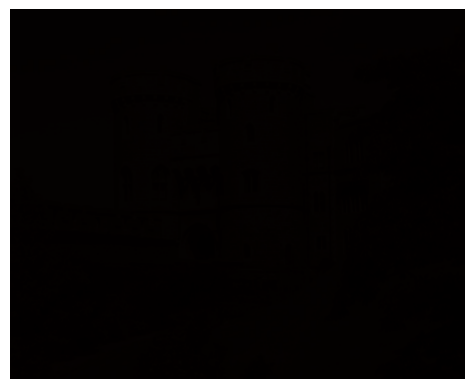

In [131]:
import cv2
import numpy as np
from sklearn.cluster import KMeans, MeanShift, estimate_bandwidth
from skimage import segmentation, measure, filters, color
from skimage.color import rgb2lab, lab2rgb
import matplotlib.pyplot as plt

# Constants from the paper
K_CLUSTERS = 2
MIN_SUPERPIXELS = 3

# Function to perform segmentation using watershed and mean shift
def segment_image(image):
    if len(image.shape) == 2 or image.shape[2] == 1:  # Grayscale image
        gray_image = image / 255.0
        lab_image = np.stack([gray_image] * 3, axis=-1)  # Convert to fake RGB for LAB conversion
    else:  # RGB image
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) / 255.0
        lab_image = rgb2lab(image)

    smoothed_image = filters.gaussian(gray_image, sigma=1)
    gradient = filters.sobel(smoothed_image)

    markers = np.zeros_like(gray_image, dtype=np.int32)
    markers[gray_image < 0.3] = 1
    markers[gray_image > 0.7] = 2

    segmentation_result = segmentation.watershed(gradient, markers)
    labeled_segments = measure.label(segmentation_result)

    ab = lab_image[:, :, 1:3].reshape((-1, 2))

    bandwidth = estimate_bandwidth(ab, quantile=0.1, n_samples=500)
    ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
    ms.fit(ab)
    labels = ms.labels_.reshape(lab_image.shape[:2])

    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(labeled_segments, cmap='nipy_spectral')
    plt.title('Watershed Segmentation')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(labels, cmap='nipy_spectral')
    plt.title('Mean Shift Segmentation')
    plt.axis('off')
    plt.show()

    return labeled_segments

# Function to reassign colors based on clustering and voting
def reassign_colors(initial_colorized_lab, target_superpixels):
    segments = np.unique(target_superpixels)
    new_lab = initial_colorized_lab.copy()
    
    for seg in segments:
        mask = target_superpixels == seg
        segment_pixels = initial_colorized_lab[mask]
        
        if len(segment_pixels) < MIN_SUPERPIXELS:
            continue
        
        ab_values = segment_pixels[:, 1:3]
        kmeans = KMeans(n_clusters=K_CLUSTERS, n_init=10)
        labels = kmeans.fit_predict(ab_values)
        
        cluster_sizes = np.bincount(labels)
        max_cluster = np.argmax(cluster_sizes)
        
        for i, size in enumerate(cluster_sizes):
            if size < 0.5 * cluster_sizes[max_cluster]:
                mask_invalid = (labels == i)
                valid_colors = ab_values[labels == max_cluster]
                mean_color = np.mean(valid_colors, axis=0)
                segment_pixels[mask_invalid, 1:3] = mean_color
        
        new_lab[mask] = segment_pixels
        
        # plt.imshow(lab2rgb(new_lab))
        # plt.title(f'After reassigning colors for segment {seg}')
        # plt.axis('off')
        # plt.show()
    
    return new_lab

# Example usage:
segmented = segment_image(target_image)
reassigned_lab = reassign_colors(initial_colorized_lab, target_superpixels)
reassigned_rgb = (lab2rgb(reassigned_lab) * 255).astype(np.uint8)
plt.imshow(reassigned_rgb)
plt.axis('off')
plt.show()
